###### Dataset initialising functions

In [ ]:
urls = ['https://i.ibb.co/jzJBq5G/bookpage-2.jpg',
        'https://i.ibb.co/GHXpFh9/tom.jpg',
        'https://i.ibb.co/QHVRtQY/bookpage-1.jpg',
        'https://i.ibb.co/sgH2b2n/panther.jpg'
        ]
import requests
import cv2
import numpy as np
import matplotlib.pyplot as plt

imgs_ = [
    cv2.imdecode(
        np.asarray(
            bytearray(
                requests.get(url).content
                ),
            dtype="uint8"
            ),1
        )
    for url in urls
]
imgs = [cv2.cvtColor(i,cv2.COLOR_BGR2GRAY) for i in imgs_]

### Generate Histogram

Procedure: We go to each pixel in image and see its intensity value. Based on it, we create a histogram.

In [ ]:
def get_histogram(img):
  hist = np.zeros(256)
  l,b = img.shape
  for i in range(l):
    for j in range(b):
      hist[round(img[i,j])]+=1
  return hist/np.sum(hist)

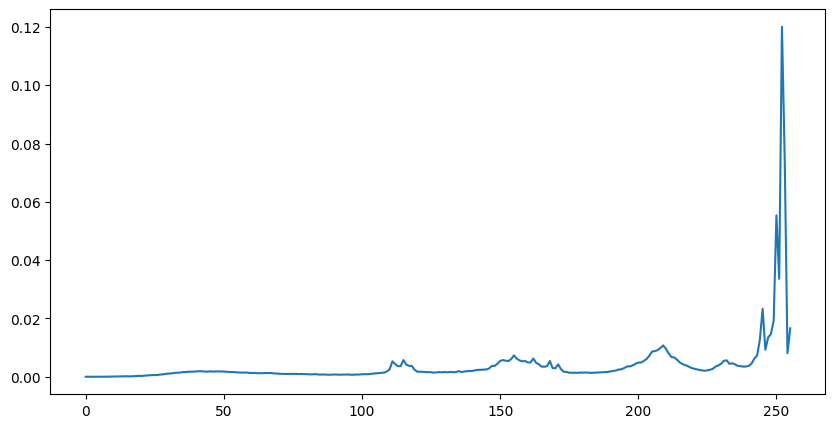

In [ ]:
# @title Example histogram of an image
plt.rcParams["figure.figsize"] = (10,5)
plt.plot(get_histogram(imgs[3]))
plt.show()

### Get the value of $V_{w}$ or $V_{b}$ and the threshold value

The binarised image would contain only two intensity values, 0 and 255.

Now we have to divide the intensity range from 0 to 255 into two classes. Let them be $C_{0}$ and $C_{1}$.

To get the best possible binarisation, we have two paths:
1. To minimise the class variance withnin the classes for both classes. [minimise intra-class variance ($\sigma_{w}^2$)]
2. To maximise the class variance between the classes. [maximise inter-class variance ($\sigma_{b}^2$)]

---
Let the threshold value be $t$.<br>
We divide the histogram ( $P(i)$ vs $i$ ) into two parts, from (0 to t) and from (t+1 to 255).<br>

Let the probability of pixel to be in class $i$ be $w_{i}$.
<br>
$$
w_{0} = \sum_{i=0}^{t} P(i)
$$
<br>
$$
w_{1} = \sum_{i=t+1}^{255} P(i)
$$

Let the mean of class $i$ be $m_{i}$
$$
m_{0} = \sum_{i=0}^{t} \frac{i \times P(i)}{w_{0}}
$$
<br>
$$
m_{1} = \sum_{i=t+1}^{255} \frac{i \times P(i)}{w_{1}}
$$

Let the variance of class $i$ be $m_{i}$
$$
v_{0} = \sum_{i=0}^{t} \frac{(i-m_{0})^{2} \times P(i)}{w_{0}}
$$
<br>
$$
v_{1} = \sum_{i=t+1}^{255} \frac{(i-m_{1})^2 \times P(i)}{w_{1}}
$$

The intra-class variance, $\sigma_{w}$, is given by,
$$
\sigma_{w} = w_{0}.v_{0} + w{1}.v_{1}
$$

The inter-class variance, $\sigma_{b}$, is given by,
$$
\sigma_{b} = w_{0}.w_{1}.(m_{0}-m_{1})^2
$$
<br>
We can either minimise $\sigma_{w}$ or maximise $\sigma_{b}$


In [ ]:
def get_V_for_given_t(hist,t):
  w0 = np.sum(hist[:t])
  w1 = np.sum(hist[t:])
  if w0 == 0 or w1 == 0:
    return np.inf,-np.inf
  m0 = np.sum([i*hist[i]/w0 for i in range(1,t)])
  m1 = np.sum([i*hist[i]/w1 for i in range(t,256)])
  v0 = np.sum([(i-m0)**2*hist[i]/w0 for i in range(1,t)])
  v1 = np.sum([(i-m1)**2*hist[i]/w1 for i in range(t,256)])

  return w0*v0 + w1*v1, w0*w1*(m0-m1)**2

def get_final_img(img):
  ls = []
  lsvb = []
  hist = get_histogram(img)
  for t in range(256):
    Vw,Vb = get_V_for_given_t(hist,t)
    ls.append(Vw)
    lsvb.append(Vb)

  min_idx = 0
  min_val = np.inf

  for i in range(256):
    if ls[i]<min_val:
      min_val = ls[i]
      min_idx = i
  max_idx = 0
  max_val = -np.inf

  for i in range(256):
    if lsvb[i]>max_val:
      max_val = lsvb[i]
      max_idx = i

  final_mapping = [0]*(min_idx+1) + [255] * (255-min_idx)

  l,b = img.shape
  new = np.zeros((l,b))
  for i in range(l):
    for j in range(b):
      new[i,j] = final_mapping[round(img[i,j])]

  return new,ls,lsvb,min_idx,max_idx

### Noise and Binarisation

We can also add gaussian noise and then binarise the image.
<br>
We define gaussian noise with mean zero and variance as given by the user.

In [ ]:
def add_noise(img,sigma):
  noz = np.random.normal(loc=0,scale=sigma,size=img.shape)
  f = img  + noz
  # print(noz.round())
  g = np.zeros(f.shape)
  l,b = f.shape
  for i in range(l):
    for j in range(b):
      g[i,j] = max(round(min(255,f[i,j])),0)
  return g.round()

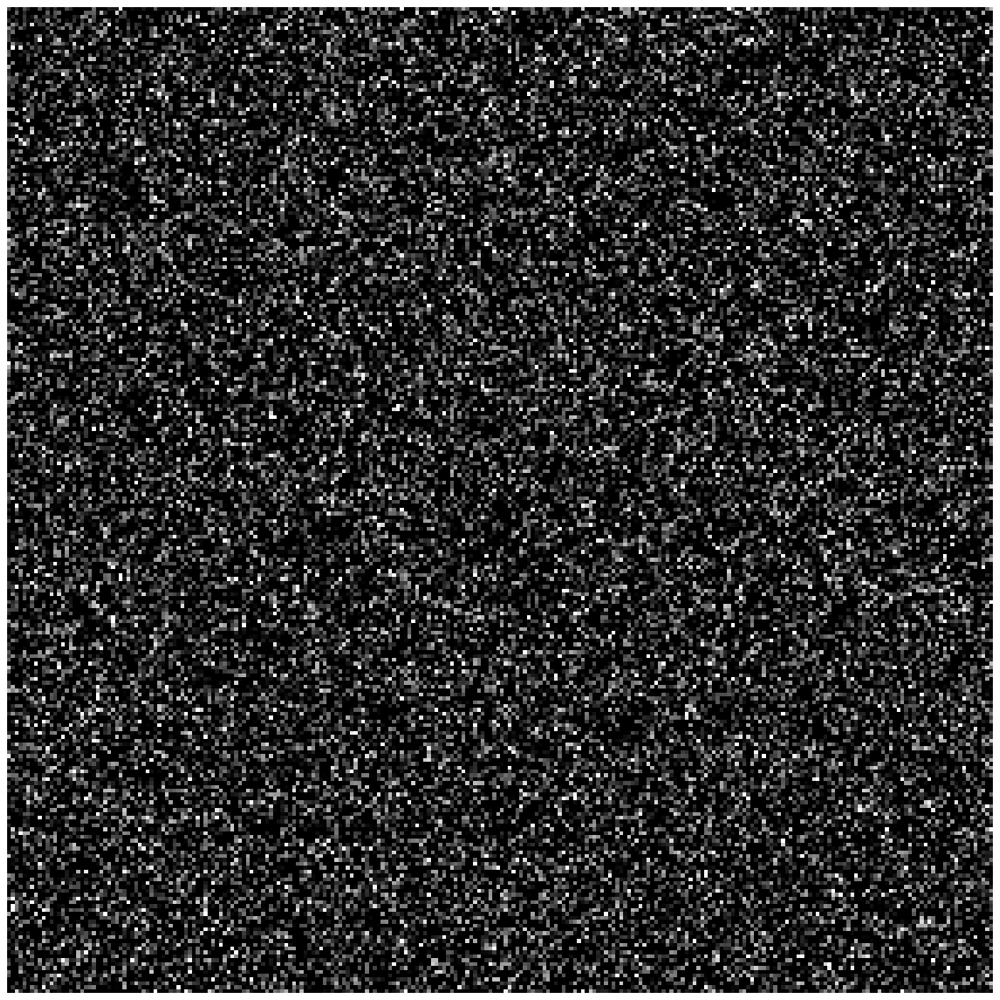

In [ ]:
# @title Noise Example

plt.imshow(add_noise(np.zeros((256,256)),100),cmap='gray')
plt.axis('off')
plt.show()

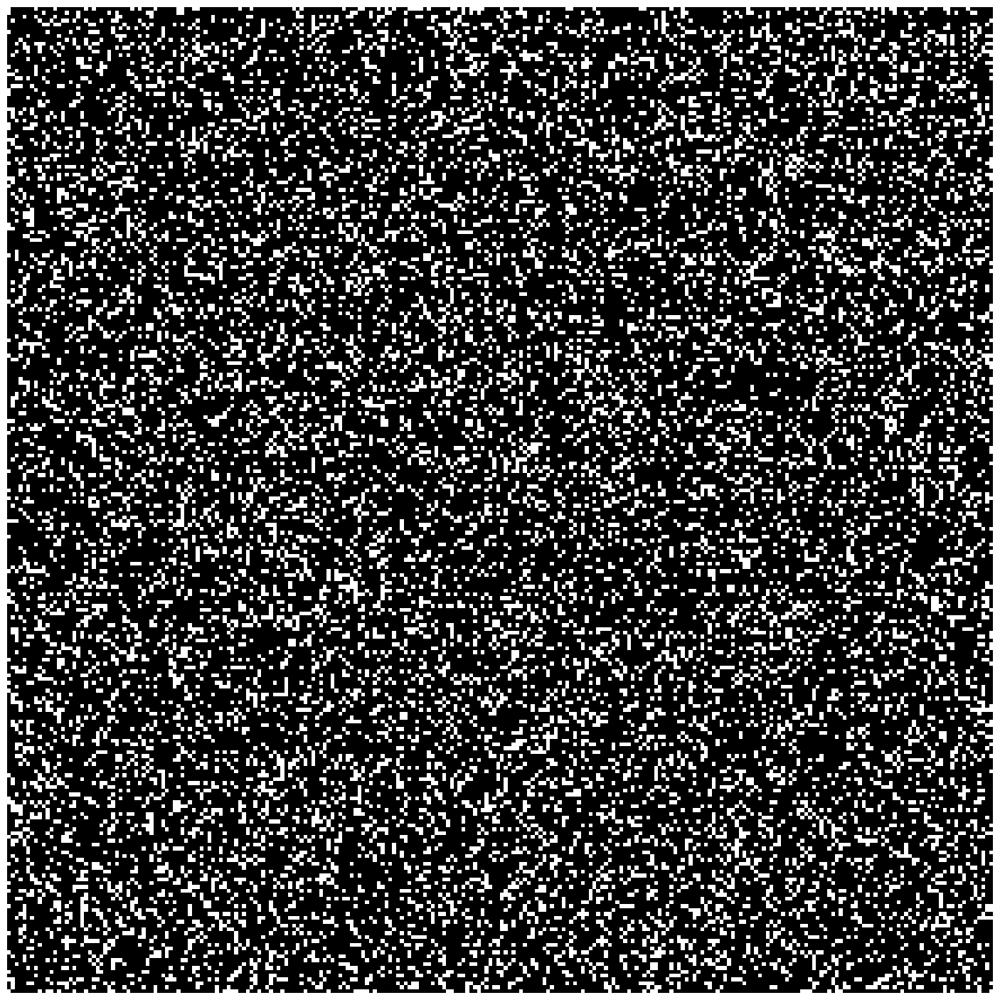

In [ ]:
# @title Running image binarisation on this noise, we get
plt.imshow(get_final_img(add_noise(np.zeros((256,256)),100))[0],cmap='gray')
plt.axis('off')
plt.show()

### Running this algorithm for images provided in the dataset

In [ ]:
# @title Helper functions

import matplotlib.pyplot as plt

def show_result(img,variance_1,variance_2,variance_3,variance_4,figsize):
  plt.rcParams["figure.figsize"] = figsize
  plt.subplot(2,4,1)
  plt.imshow(img,cmap='gray')
  plt.axis('off')
  plt.title('Original Image')
  plt.subplot(2,4,2)
  final_img,lsvw,lsvb,xvw,xvb = get_final_img(img)
  plt.imshow(final_img,cmap='gray')
  plt.axis('off')
  plt.title('Binarised Image')
  plt.subplot(2,4,3)
  plt.title('Variance within pixels vs threshold')
  plt.xlabel('t (Threshold)')
  plt.ylabel('$\sigma_{w}^{2}$')
  plt.annotate(f'({xvw}, {round(min(lsvw))})',(xvw,min(lsvw)-5))
  plt.plot(range(0,256),lsvw)
  plt.plot(xvw,min(lsvw),'ro',markersize=8)
  plt.subplot(2,4,4)
  plt.title('Variance between pixels vs threshold')
  plt.xlabel('t (Threshold)')
  plt.ylabel('$\sigma_{b}^{2}$')
  plt.annotate(f'({xvb}, {round(max(lsvb))})',(xvb,max(lsvb)+5))
  plt.plot(range(0,256),lsvb)
  plt.plot(xvb,max(lsvb),'ro',markersize=8)
  plt.subplot(2,4,5)
  plt.imshow(get_final_img(add_noise(img,np.sqrt(variance_1)))[0],cmap='gray')
  plt.axis('off')
  plt.title(f'Binarised Image with $\sigma^2 = {variance_1}$')
  plt.subplot(2,4,6)
  plt.imshow(get_final_img(add_noise(img,np.sqrt(variance_2)))[0],cmap='gray')
  plt.axis('off')
  plt.title(f'Binarised Image with $\sigma^2 = {variance_2}$')
  plt.subplot(2,4,7)
  plt.imshow(get_final_img(add_noise(img,np.sqrt(variance_3)))[0],cmap='gray')
  plt.axis('off')
  plt.title(f'Binarised Image with $\sigma^2 = {variance_3}$')
  plt.subplot(2,4,8)
  plt.imshow(get_final_img(add_noise(img,np.sqrt(variance_4)))[0],cmap='gray')
  plt.axis('off')
  plt.title(f'Binarised Image with $\sigma^2 = {variance_4}$')
  plt.show()

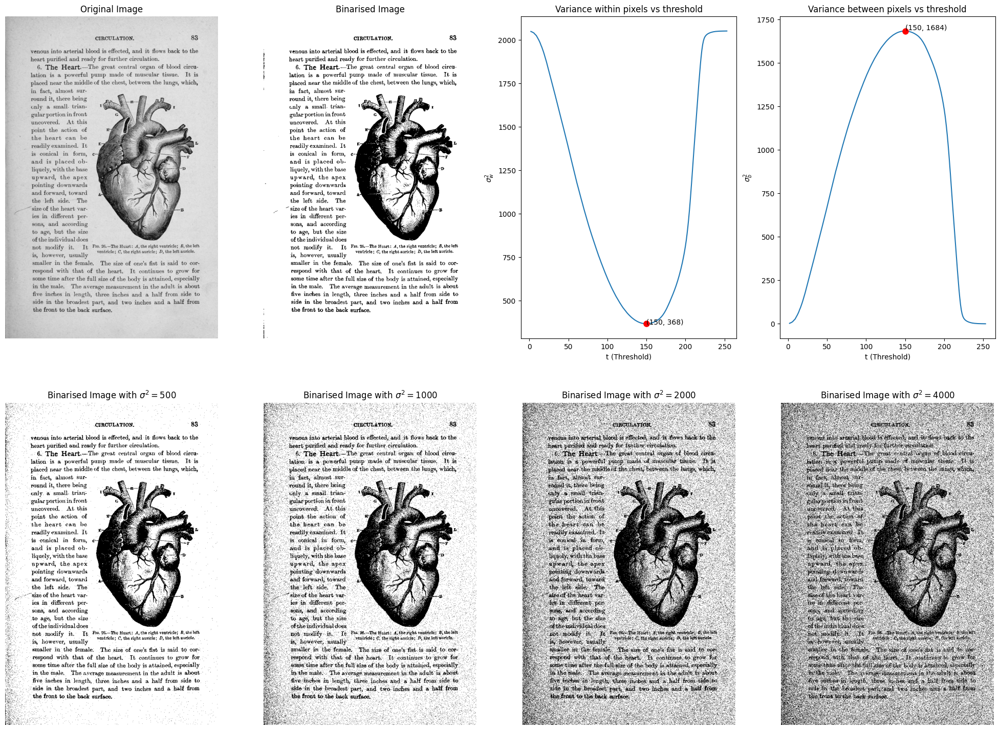

In [ ]:
# @title Dataset Image 1
variance_1 = 500 # @param {type:"number"}
variance_2 = 1000 # @param {type:"number"}
variance_3 = 2000 # @param {type:"number"}
variance_4 = 4000 # @param {type:"number"}
show_result(imgs[0],variance_1,variance_2,variance_3,variance_4,(25,18))

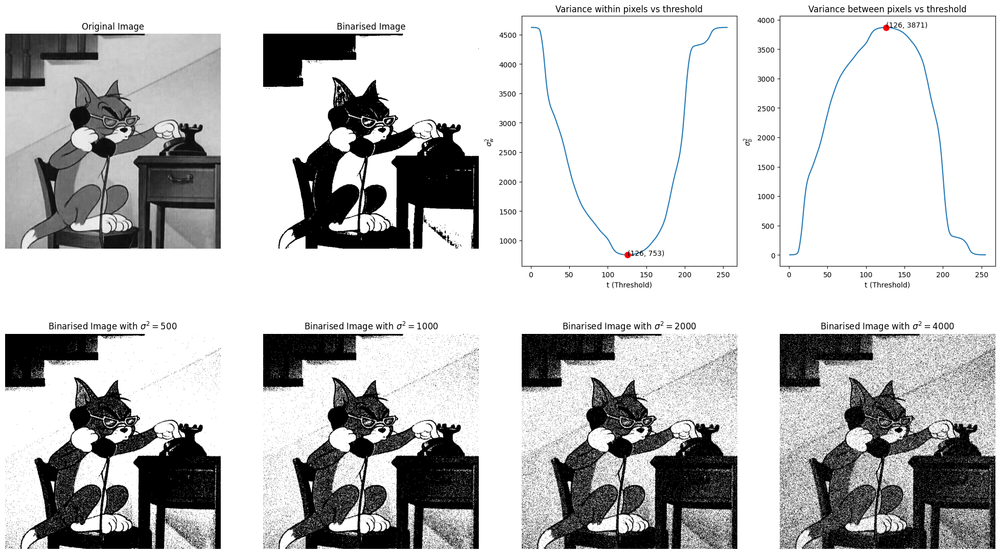

In [ ]:
# @title Dataset Image 2
variance_1 = 500 # @param {type:"number"}
variance_2 = 1000 # @param {type:"number"}
variance_3 = 2000 # @param {type:"number"}
variance_4 = 4000 # @param {type:"number"}
show_result(imgs[1],variance_1,variance_2,variance_3,variance_4,(25,14))

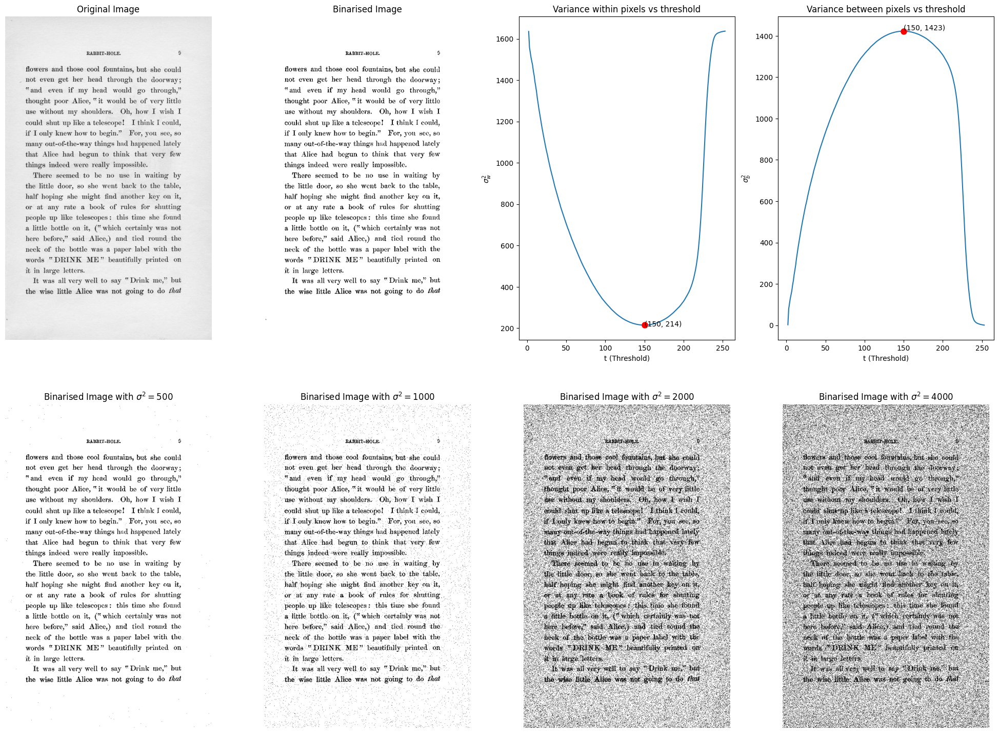

In [ ]:
# @title Dataset Image 3
variance_1 = 500 # @param {type:"number"}
variance_2 = 1000 # @param {type:"number"}
variance_3 = 2000 # @param {type:"number"}
variance_4 = 4000 # @param {type:"number"}
show_result(imgs[2],variance_1,variance_2,variance_3,variance_4,(25,18))

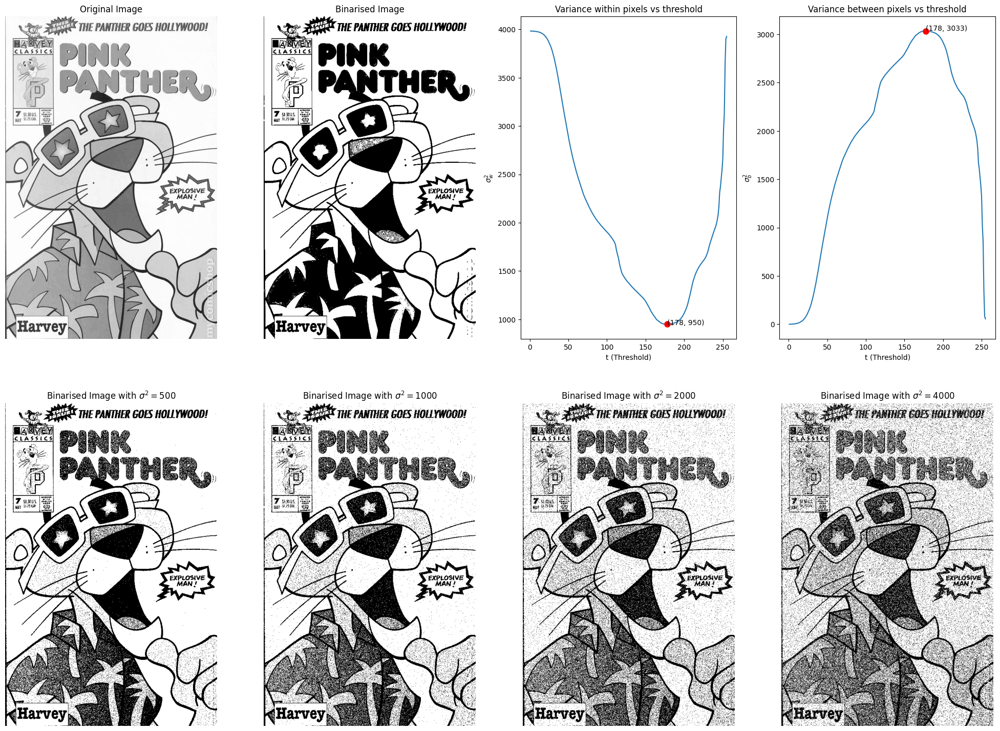

In [ ]:
# @title Dataset Image 4
variance_1 = 500 # @param {type:"number"}
variance_2 = 1000 # @param {type:"number"}
variance_3 = 2000 # @param {type:"number"}
variance_4 = 4000 # @param {type:"number"}
show_result(imgs[3],variance_1,variance_2,variance_3,variance_4,(25,18))